# Imports

## Modules and libraries

In [1]:
# Necessarily early imports
import numpy as np, random
# Ensure deterministic output
np.random.seed(137)
random.seed(137)
import warnings
from cryptography.utils import CryptographyDeprecationWarning
warnings.filterwarnings(
    "ignore",
    category=CryptographyDeprecationWarning,
    module=r"paramiko.*",
)

# Local imports
from utils.preprocess_data_utils import *
from utils.read_utils import *
from utils.evaluate_clustering_utils import *

# External imports
# Basic libraries and modules
import os
import pandas as pd
import matplotlib.pyplot as plt
import multiprocessing as mp
import ast
from adjustText import adjust_text 
import plotly.express as px
# Specialized libraries and modules
import scanpy as sc
import muon as mu
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.multitest import multipletests
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.linear_model import Ridge
from sklearn.feature_selection import f_regression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import r2_score, homogeneity_score, roc_auc_score, balanced_accuracy_score

# Suppress chatter
# Suppress deprecation, efficiency, and verbose plotting warnings for clean output
sc.settings.verbosity = 0
from scipy.sparse import SparseEfficiencyWarning
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning) # working with df copy warning, ignore for now, might be important later
warnings.simplefilter('ignore', SparseEfficiencyWarning) # warning for inefficient matrix modification after filtering genes
warnings.filterwarnings("ignore", message=".*looks like a single numeric RGB or RGBA sequence.*") # UMAP warnings
warnings.filterwarnings("ignore", message=".*More than 20 figures have been opened")

## Data

In [2]:
# Dictionary with data file practical labels and file names
fileNameDict = {
    'gene_count': 'gene_counts.csv',
    'cell_metadata': 'cell_meta_data.csv',
    'cell_assignment': 'cell_assignment.csv',
    'embedding1': 'baysor_model_inference_VSTE-328.csv',
    'embedding2': 'staining_crops_model_inference_VSTE-322.csv',
    'embedding3': 'baysor_model_inference_VSTE-347.csv',
    'embedding4': 'baysor_model_inference_VSTE-350.csv',
    'embedding5': 'baysor_model_inference_VSTE-371.csv',
    'cp_100': 'data_crop100.db',
    'cp_300': 'data_crop300.db'
}

# Main directories
inputDir = '../data_restructured'
outputDir = '../analysis_output/final/all_genes_analyses'

# Reading data files into DFs
# Initializing raw data DF dict
rawDFDict = {}
for label, fileName in fileNameDict.items():
    # Importing all CSVs
    if fileName.endswith('csv'):
        rawDFDict[label] =  load_csv_to_df(parent_path=inputDir, file_name=fileName, index_col=0)
    # Importing SQLite DBs (CP feature data), separated into per object and per image DFs
    # These come from CellProfiler and will later be merged for downstream use
    elif fileName.endswith('db'):
        tempDF = load_db_to_df_dict(parent_path=inputDir, file_name=fileName)
        rawDFDict[label + '_perObj'] = tempDF['Per_Object']
        rawDFDict[label + '_perImg'] = tempDF['Per_Image']

# Preprocessing

In [3]:
# Checking if post-PyCytominer CP data exists in output folder (to avoid non-deterministic nature of feature selection)
# If files exist, use them directly instead of re-merging & filtering features
cpExists = False
os.makedirs(outputDir + '/CP_after_pcm', exist_ok=True)
cp100Path = outputDir + '/CP_after_pcm/cp100.csv'
cp300Path = outputDir + '/CP_after_pcm/cp300.csv'
if os.path.isfile(cp100Path) and os.path.isfile(cp300Path):
    cpExists = True

# Initializing preprocessed DF dict as a copy of the raw dict except the CP feature keys
keys2Exclude = ['cp_100', 'cp_300']
preprocessedDFDict = {key: value for key, value in rawDFDict.items() if not any(substring in key for substring in keys2Exclude)}

# Setting cell_index as index as a guard
for key, df in preprocessedDFDict.items():
    if 'cell_index' in df.columns:
        preprocessedDFDict[key] = df.set_index('cell_index')

if not cpExists:
    # Merging the CP feature DFs (first output. Otherwise, take second output for list of tuples of identical columns removed if desired)
    preprocessedDFDict['cp_100'] = merge_df_unq_cols_by_val(df1=rawDFDict['cp_100_perObj'], df2=rawDFDict['cp_100_perImg'], suffixes=('_perObj', '_perImg'))[0]
    preprocessedDFDict['cp_300'] = merge_df_unq_cols_by_val(df1=rawDFDict['cp_300_perObj'], df2=rawDFDict['cp_300_perImg'], suffixes=('_perObj', '_perImg'))[0]

# Processing cell_assignment_df (renaming, dropping 'removed' cell types and such), before common-index filtering or generating intersection matrix
tempDF = rawDFDict['cell_assignment'] # temporary assignment to preprocess the raw ground truth DF
tempDF.rename(columns={"leiden_final": "cell_type"}, inplace=True)
# Drop cells assigned "Removed" from the cell_assignment DF, these are filtered out of downstream analysis entirely
gtClusteringDF = tempDF[tempDF['cell_type'] != 'Removed']
# Assign cell type numbers
unqCellTypes = gtClusteringDF['cell_type'].unique()
cellTypeMapping = {cell_type: index + 1 for index, cell_type in enumerate(unqCellTypes)}
gtClusteringDF['cell_type_number'] = gtClusteringDF['cell_type'].map(cellTypeMapping)
# Overwriting cell_assignment DF in the preprocessed dict, copied from the raw dict
preprocessedDFDict['cell_assignment'] = gtClusteringDF

# Filtering DFs to common indices (first output. Take second output for list of common indices if desired)
preprocessedDFDict = filter_to_common_indices(dataframe_dictionary=preprocessedDFDict)[0]

if not cpExists:
    # Filtering CP data by removing irrelevant features/metadata columns
    # List of KWs that, if contained in column names, are removed
    cpColExclKWList = [
        'meta',
        'index',
        'imagenumber',
        '_y_',
        '_x_'
    ]

    preprocessedDFDict['cp_100'] = drop_irrelevant_cols(dataframe=preprocessedDFDict['cp_100'], col_name_kw_list=cpColExclKWList)[0]
    preprocessedDFDict['cp_300'] = drop_irrelevant_cols(dataframe=preprocessedDFDict['cp_300'], col_name_kw_list=cpColExclKWList)[0]

    # Exporting cleaned up CP data to ensure deterministic results
    preprocessedDFDict['cp_100'].to_csv(cp100Path, index=True)
    preprocessedDFDict['cp_300'].to_csv(cp300Path, index=True)
else:
    preprocessedDFDict['cp_100'] = pd.read_csv(cp100Path, index_col=0)
    preprocessedDFDict['cp_300'] = pd.read_csv(cp300Path, index_col=0)

# Adjusting latent variable names by prefixing with 'z_'
preprocessedDFDict = adjust_latent_var_names(dataframe_dictionary=preprocessedDFDict)

## Plotting true label distribution

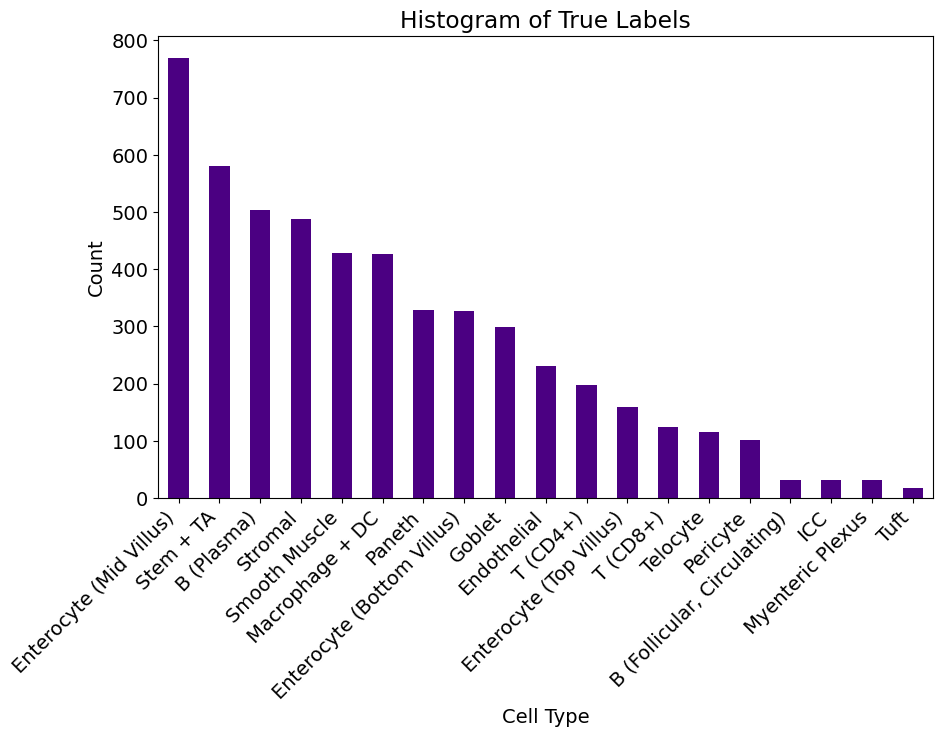

In [4]:
# Setting general font size for plt figs
plt.rcParams.update({'font.size': 14}) 

gtDF = preprocessedDFDict['cell_assignment']

cellTypeCounts = gtDF['cell_type'].value_counts()

# Plot the histogram
plt.figure(figsize=(10, 6))
cellTypeCounts.plot(kind='bar', color="indigo")
plt.xlabel('Cell Type')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Count')
plt.title('Histogram of True Labels')

# Export
os.makedirs(outputDir + '/stats', exist_ok=True)
cellTypeHistogramPath = outputDir + '/stats/true_label_histogram.png'
plt.savefig(cellTypeHistogramPath, bbox_inches='tight', dpi=600)

## Creating AnnData objects

In [5]:
# List of keys referencing DFs to create AnnData objects from
DFKey4AdObjList = [
    'gene_count',
    'embedding1',
    'embedding2',
    'embedding3',
    'embedding4',
    'embedding5',
    'cp_100',
    'cp_300'
]

# Creating AnnData objects using a helper utils fxn
adObjDict = create_anndata_obj(dataframe_dictionary=preprocessedDFDict, cell_metadata_df=preprocessedDFDict['cell_metadata'], dataframe_key_list=DFKey4AdObjList, indices_to_concatenate=None)

# Adding spatial information, needed for plotting spatial embeddings
spatialCellCoords = preprocessedDFDict['cell_metadata'][['x', 'y']].values
for key, obj in adObjDict.items():
    obj.obsm['spatial'] = np.transpose(spatialCellCoords.transpose())

# Computing sparsity (sanity check)
tcSparsity = np.mean(adObjDict['gene_count'].X == 0)
print(f"TC Sparsity: {tcSparsity:.2%}")

# Normalizing and log transforming transcript count AnnData object
tcAdObj = adObjDict['gene_count']
sc.pp.normalize_total(tcAdObj, inplace=True)
sc.pp.log1p(tcAdObj)

TC Sparsity: 89.62%


## Creating MuData objects

In [7]:
# MuData object containing each dataset as a modality. An alternative to a dictionary of AnnData objects
mdObjAll = mu.MuData({
    'TC': adObjDict['gene_count'],
    'LS1': adObjDict['embedding1'],
    'LS2': adObjDict['embedding2'],
    'LS3': adObjDict['embedding3'],
    'LS4': adObjDict['embedding4'],
    'LS5': adObjDict['embedding5'],
    'CPsm': adObjDict['cp_100'],
    'CPlg': adObjDict['cp_300']
})

# Names of AnnData objects that will be combinatorially constructed with TC as MuData objects
augModalityNames = ['LS1', 'LS2', 'LS3', 'LS4', 'LS5', 'CPsm', 'CPlg']
# Dict containing the combinatorial MuData objects
mdObjComboDict = {
    f'TC+{augMod}': mu.MuData({
        'TC': mdObjAll['TC'],
        augMod: mdObjAll[augMod]
    }) for augMod in augModalityNames
}

# Clustering

## Generating reference GT spatial map

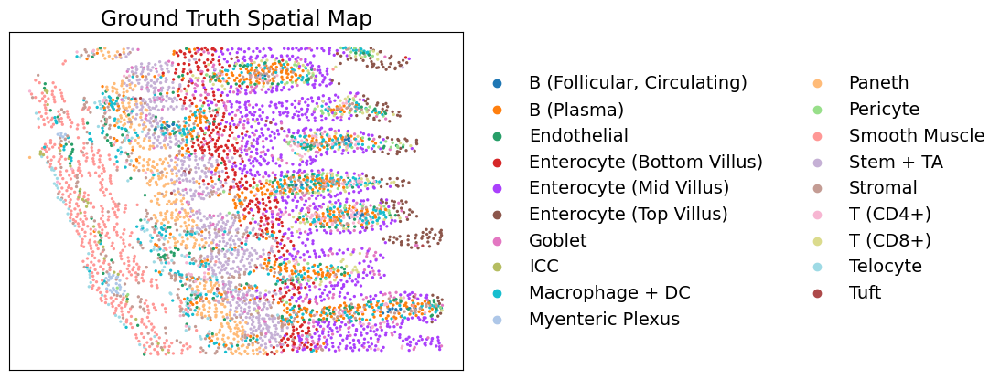

In [8]:
# Interactive map for reference, not used downstream
# Spatial coordinates (N x 2 numpy array)
coords = mdObjAll.mod['TC'].obsm['spatial']

# True labels
trueLabelSeries = preprocessedDFDict['cell_assignment']['cell_type']

# Prepare the data for Plotly
data4InteractivePlot = pd.DataFrame({
    'X': coords[:, 0],              
    'Y': coords[:, 1],             
    'True Label': trueLabelSeries      
})

# Create the interactive scatter plot
fig = px.scatter(
    data4InteractivePlot,
    x='X', 
    y='Y', 
    color='True Label',  # Color points by their true labels
    title="Spatial Plot of Cells with True Labels",
    hover_data={'X': True, 'Y': True, 'True Label': True}  # Add hover information
)

# Customize layout
fig.update_layout(
    width=1000,
    height=1000,
    legend_title="True Labels",
    xaxis_title="X Coordinate",
    yaxis_title="Y Coordinate",
    legend=dict(
        x=1.05,  # Position legend outside the plot
        y=1,
        traceorder="normal"
    )
)

# Show the interactive plot
fig.show()

# Generating static GT spatial map and exporting
os.makedirs(outputDir + '/spatial_and_umaps', exist_ok=True)
gtSpatialMapPath = outputDir + '/spatial_and_umaps/ground_truth_spatial_map.png'
 
gtAdObj = mdObjAll.mod['TC'].copy()
gtAdObj.obs['true_label_clusters'] = preprocessedDFDict['cell_assignment']['cell_type'].values
sc.pl.embedding(gtAdObj, basis="spatial", color="true_label_clusters", title=f"Ground Truth Spatial Map", show=False)
# Dropping axis titles
plt.gca().set_xlabel("")
plt.gca().set_ylabel("")
plt.savefig(gtSpatialMapPath, dpi=600, bbox_inches="tight")

#  Clustering individual modalities

## Finding optimal clustering hyperparameters

In [9]:
# Creating optimization worker fxn
def AnnData_optimization_worker_fxn(args):
    # Unpacking args
    key, object, metadata = args
    
    # Ensure no NaNs (relevant for CP data where NaNs are extremely rare)
    object.X = np.nan_to_num(object.X, nan=np.nanmean(object.X, axis=0))
    
    # Optimizing k and resolution hyperparameters
    optimalHyperparams = optimize_leiden_hyperparams(object, min_clusters=metadata['AnnData_min_clusters'], k_range=metadata['AnnData_k_range'], resolution_range=metadata['AnnData_resolution_range'], resolution_threshold=metadata['AnnData_resolution_threshold'], increment_multiple_after_threshold=metadata['AnnData_increment_multiple_after_threshold'])
    
    return key, optimalHyperparams

# Checking if optimization was already done and the hyperparameter csv exists
optimizationDone = False
os.makedirs(outputDir + '/optimization', exist_ok=True)
adOptimizedHyperparamsPath = outputDir + '/optimization/AnnData_optimal_leiden_hyperparams.csv'
if os.path.isfile(adOptimizedHyperparamsPath):
    optimizationDone = True

# Initializing dictionary
optimalLeidenHyperparamsDict = {
    'AnnData': {
        'metadata': {
            'AnnData_min_clusters' : 5,
            'AnnData_k_range': (5,50,5),
            'AnnData_resolution_range': (0.5,10,0.05),
            'AnnData_resolution_threshold': 1,
            'AnnData_increment_multiple_after_threshold': 20
        },
        'results': {}
    },
    'MuData': {
        'metadata': {},
        'results': {}
    }
}

if not optimizationDone:
    # Parallelizing optimization
    if __name__ == "__main__":
        # Prepare arguments for worker fxn
        metadata = optimalLeidenHyperparamsDict['AnnData']['metadata']
        argsList = [(key, obj, metadata) for key, obj in mdObjAll.mod.items()] 
        
        # Launching in parallel using multiprocessing.Pool
        with mp.Pool(processes=7) as pool:
            results = pool.map(AnnData_optimization_worker_fxn, argsList)
    
        # Aggregating results
        for key, mdObjOptimalLeidenHyperparams in results:
            optimalLeidenHyperparamsDict['AnnData']['results'][key] = mdObjOptimalLeidenHyperparams.copy()
    
        # Exporting optimal hyperparameters
        pd.DataFrame.from_dict(optimalLeidenHyperparamsDict['AnnData'], orient='index').to_csv(adOptimizedHyperparamsPath)

# If optimization was already ran, load data into the dict
else:
    optimalLeidenHyperparamsDict['AnnData'] = pd.read_csv(adOptimizedHyperparamsPath, index_col=0).to_dict(orient='index')
    # Clean up, filtering NaNs from nested dictionary 
    optimalLeidenHyperparamsDict['AnnData']['metadata'] = {k: v for k, v in optimalLeidenHyperparamsDict['AnnData']['metadata'].items() if not (isinstance(v, float) and pd.isna(v))}
    optimalLeidenHyperparamsDict['AnnData']['results'] = {k: v for k, v in optimalLeidenHyperparamsDict['AnnData']['results'].items() if not (isinstance(v, float) and pd.isna(v))}

## Clustering individual modalities using optimal Leiden hyperparameters

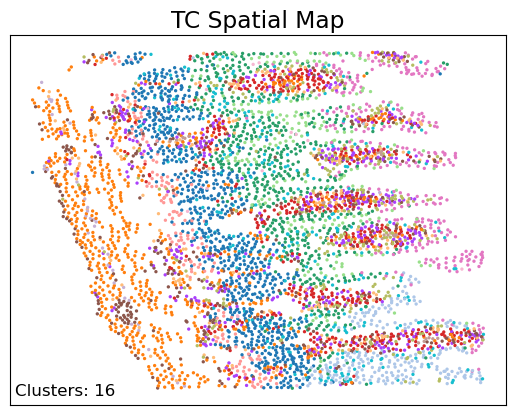

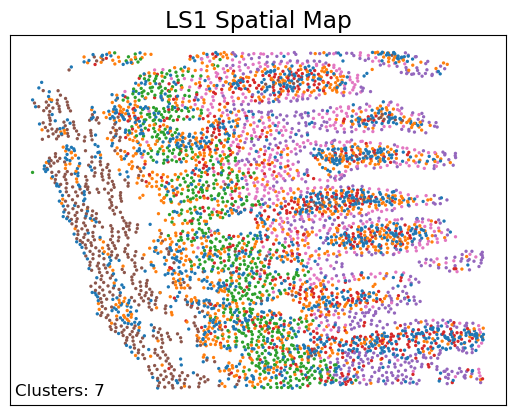

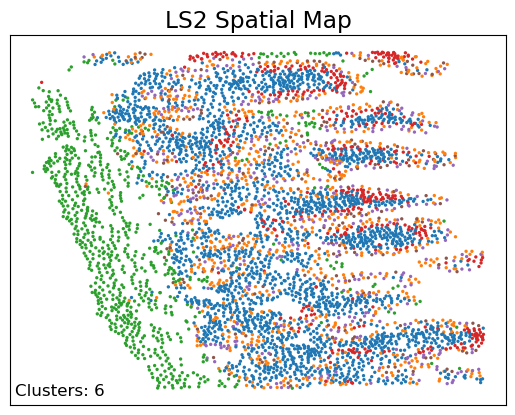

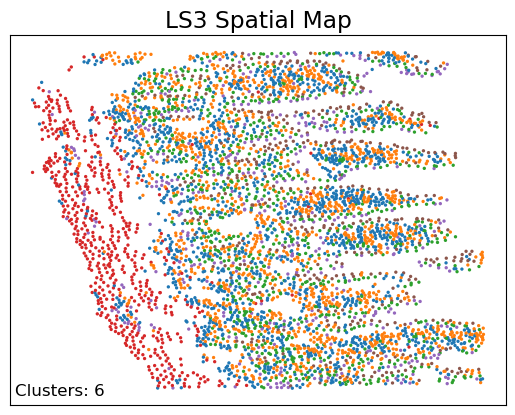

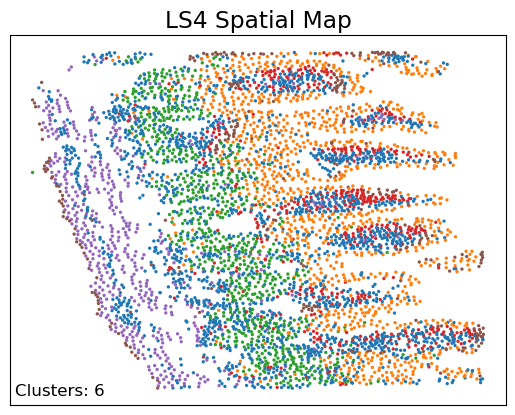

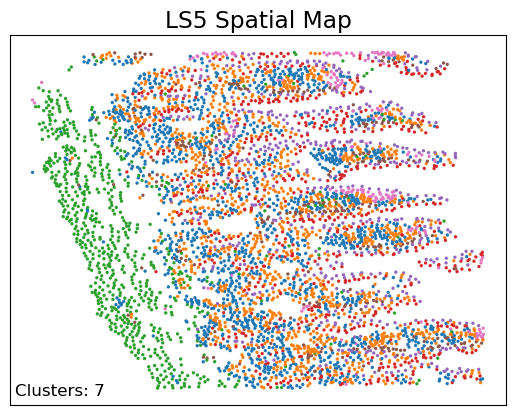

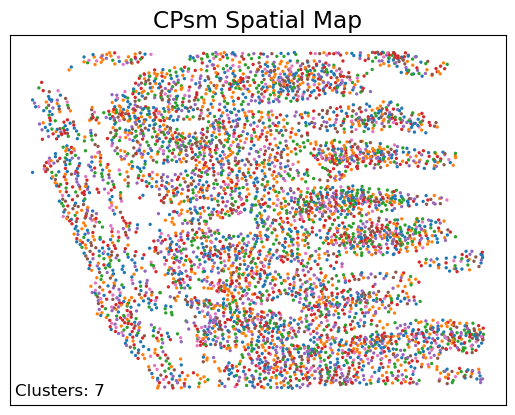

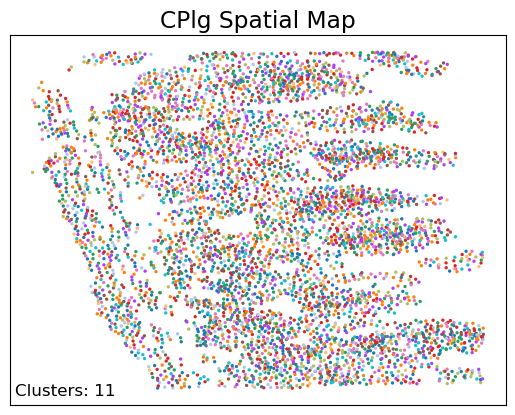

In [10]:
for key, obj in mdObjAll.mod.items():
    # Ensure no NaNs (relevant for CP data where NaNs are extremely rare)
    obj.X = np.nan_to_num(obj.X, nan=np.nanmean(obj.X, axis=0))

    # Clearing previous clustering data as a precaution
    tempDict = {key: obj}
    clear_clustering_data(tempDict)
    
    # Args. 
    # Setting nPCs to 0 forces clustering of data itself and not a representation (as the data is not dimensionally huge)
    # i.e. PCA is skipped and k-NN built on original features
    nPCs = 0
    # Converting str to dictionary in case the optimal hyperparameters were imported from a previous run
    if isinstance(optimalLeidenHyperparamsDict['AnnData']['results'][key], str):
        optimalLeidenHyperparamsDict['AnnData']['results'][key] = ast.literal_eval(optimalLeidenHyperparamsDict['AnnData']['results'][key])
    # Setting the two optimized Leiden hyperparams (n_neighbors, i.e. k in k-NN, and resolution, i.e. gamma in the objective modularity fxn)  
    nNeighbors = optimalLeidenHyperparamsDict['AnnData']['results'][key]['n_neighbors']
    resolution = optimalLeidenHyperparamsDict['AnnData']['results'][key]['resolution']
    
    # Export path
    indivModSpatialMapPath = outputDir + f'/spatial_and_umaps/{key}_spatial_map.png'
    
    # Running k-NN generation and Leiden clustering
    sc.pp.neighbors(obj, n_neighbors=nNeighbors, n_pcs=nPCs, random_state=137)
    sc.tl.leiden(obj, key_added='clusters', resolution=resolution)
    sc.pl.embedding(obj, basis="spatial", color="clusters", title=f"{key} Spatial Map", legend_loc='none', show=False)
    
    # Adding nClusters as text on the plot
    nClusters = obj.obs['clusters'].nunique()
    plt.gca().text(0.01, 0.02, f'Clusters: {nClusters}',
                   horizontalalignment='left',
                   verticalalignment='bottom',
                   transform=plt.gca().transAxes,
                   fontsize=12, color='black')
    # Dropping axis titles
    plt.gca().set_xlabel("")
    plt.gca().set_ylabel("")
    # Export
    plt.savefig(indivModSpatialMapPath, dpi=600, bbox_inches="tight")

## Generating ground truth-annotated UMAPs of the feature spaces (modalities)

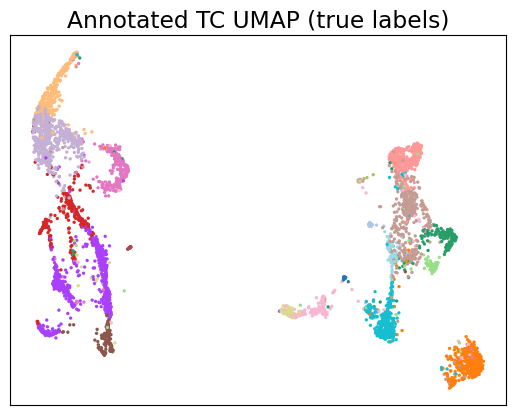

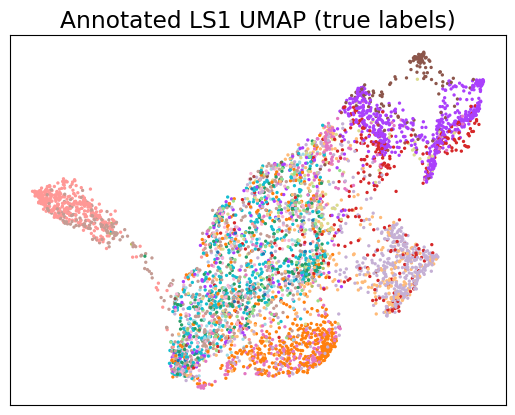

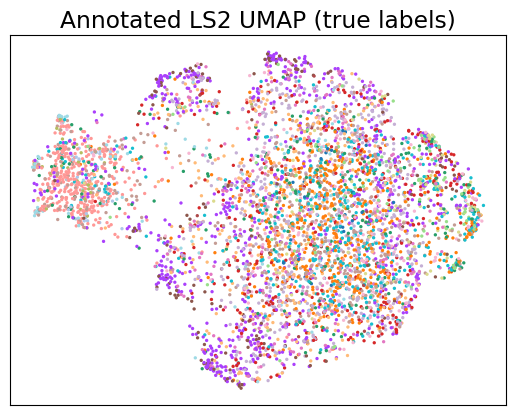

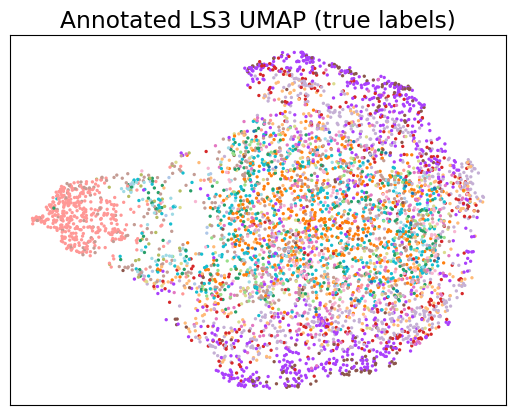

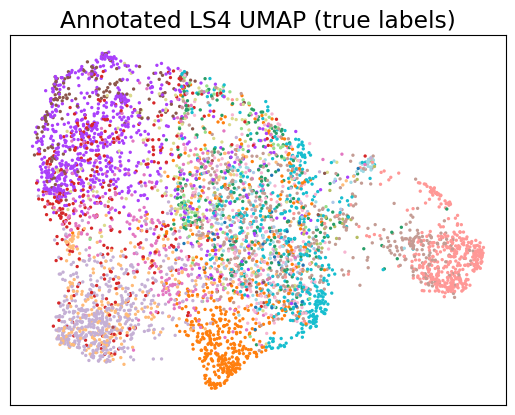

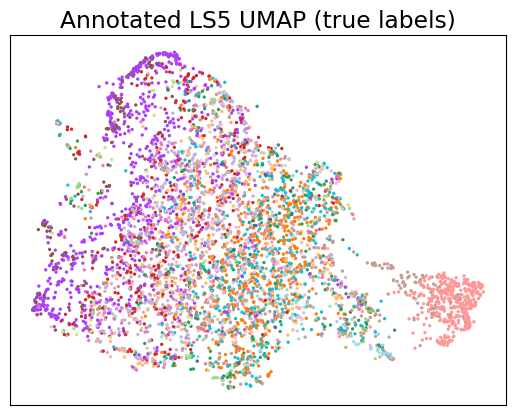

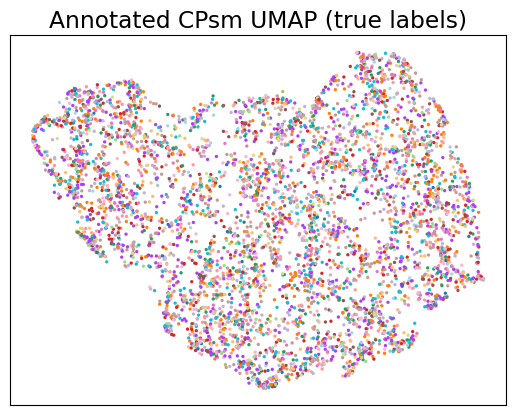

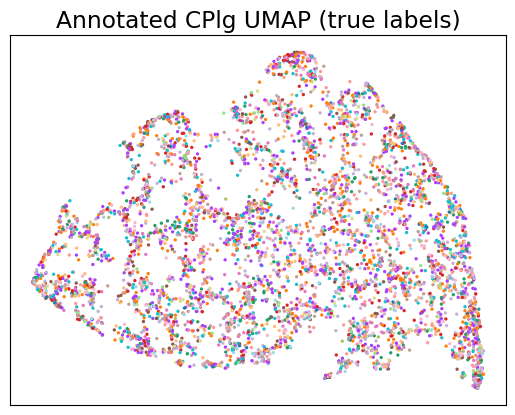

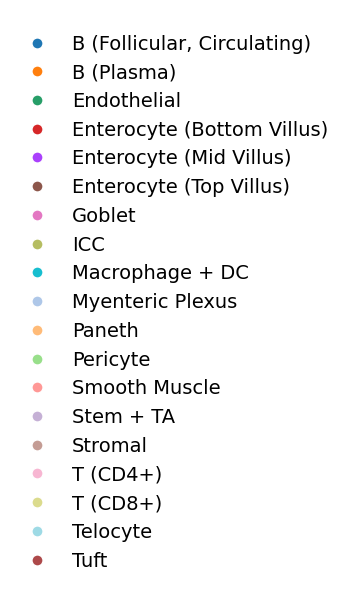

In [11]:
# Generate UMAPs
for key, obj in mdObjAll.mod.items():
    sc.tl.umap(obj, n_components=2, min_dist=0.05)
    
    # Assign true labels for ground truth overlay on UMAP plots (used to visually inspect separation)
    obj.obs['true_label_clusters'] = preprocessedDFDict['cell_assignment']['cell_type'].values.astype(str)
    
    # Plot UMAP without legend
    sc.pl.umap(obj, color=["true_label_clusters"], 
               title=f"Annotated {key} UMAP (true labels)", 
               legend_loc='none', show=False)
    # Dropping axis titles
    plt.gca().set_xlabel("")
    plt.gca().set_ylabel("")
    
    # Export
    path_umap = outputDir + f'/spatial_and_umaps/{key}_annotated_umap.png'
    plt.savefig(path_umap, dpi=600, bbox_inches="tight")

    # Extract colors assigned by scanpy to ensure common true label legend
    if "true_label_clusters_colors" in obj.uns:
        clusterColorsUmaps = obj.uns["true_label_clusters_colors"]
    else:
        raise ValueError(f"Scanpy did not generate colors for {key}")

# Generate separate legend figure using extracted color matching
unqLabels = obj.obs['true_label_clusters'].cat.categories  # Takes last obj since all UMAPs share the same legend
fig, ax = plt.subplots(figsize=(4, len(unqLabels) * 0.4)) 
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=clusterColorsUmaps[i], markersize=8)
           for i in range(len(unqLabels))]

ax.legend(handles, unqLabels, loc="center", frameon=False)
ax.set_xticks([])
ax.set_yticks([])
ax.axis("off")

# Save the legend as a separate figure
legend_path = outputDir + '/spatial_and_umaps/true_label_umap_legend.png'
plt.savefig(legend_path, dpi=600, bbox_inches="tight")

## Evaluating individual modality clustering

Exported cluster correlation DataFrame to /home/qptero/Desktop/output2/individual_modality_metrics/cluster_correl_combined.csv


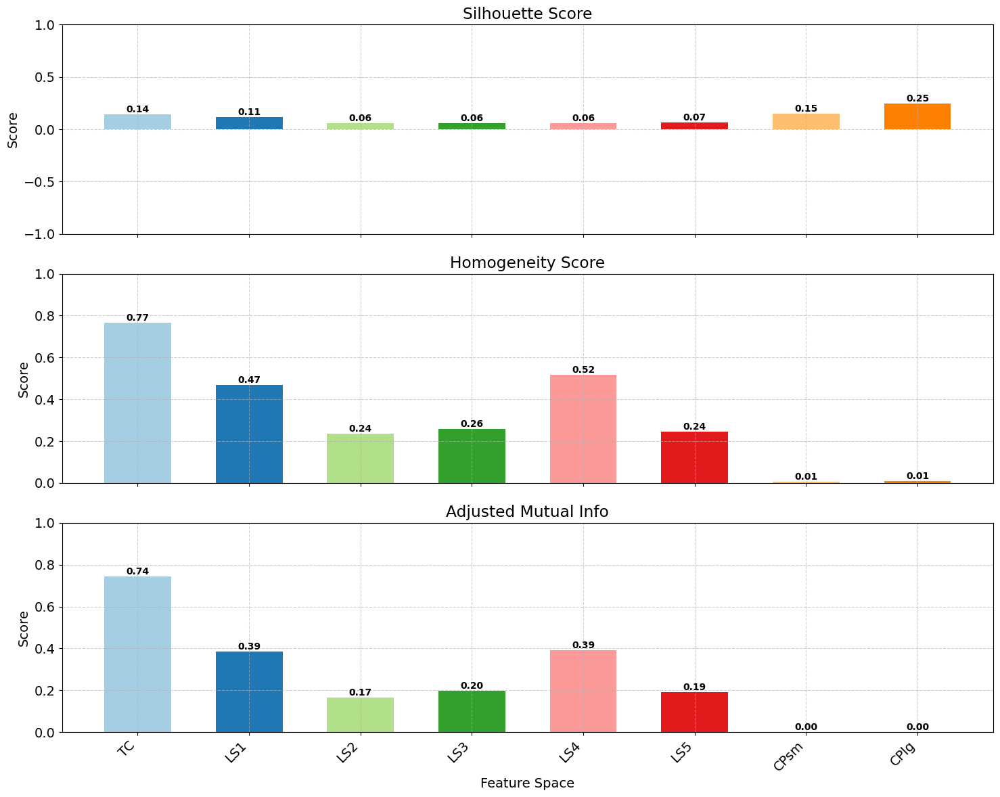

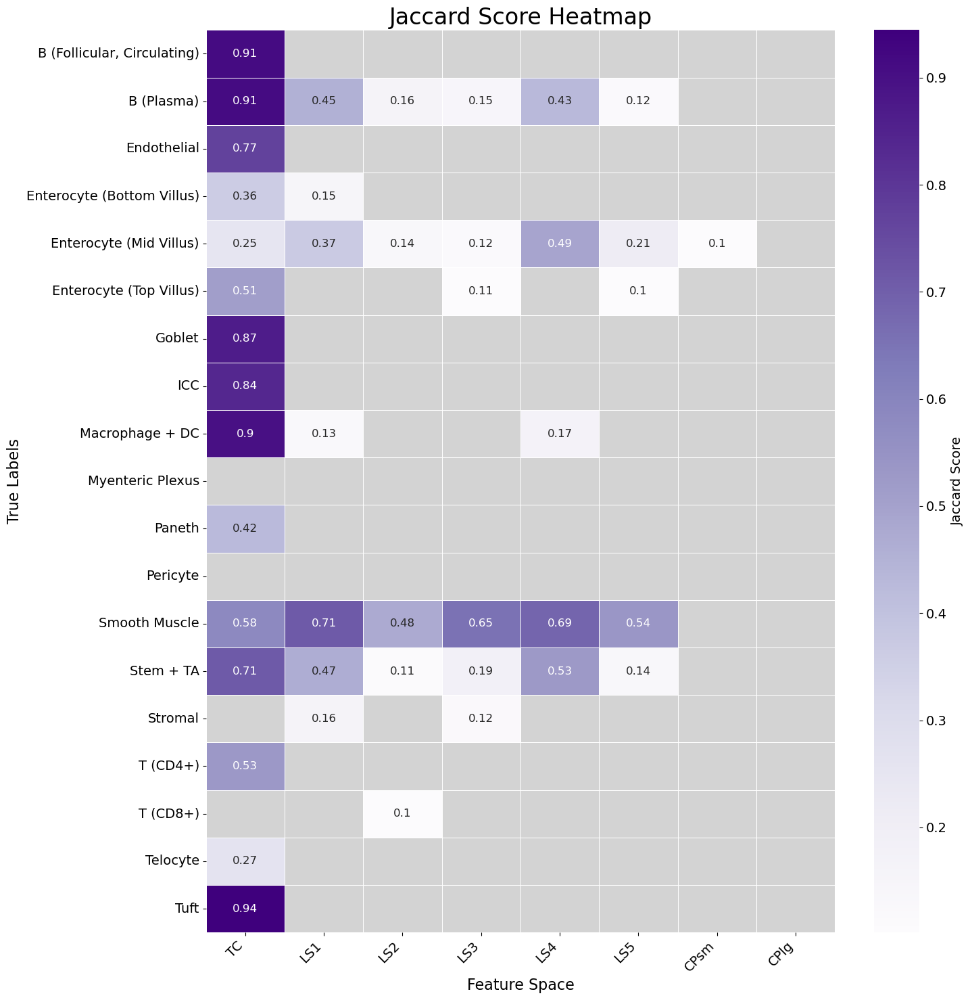

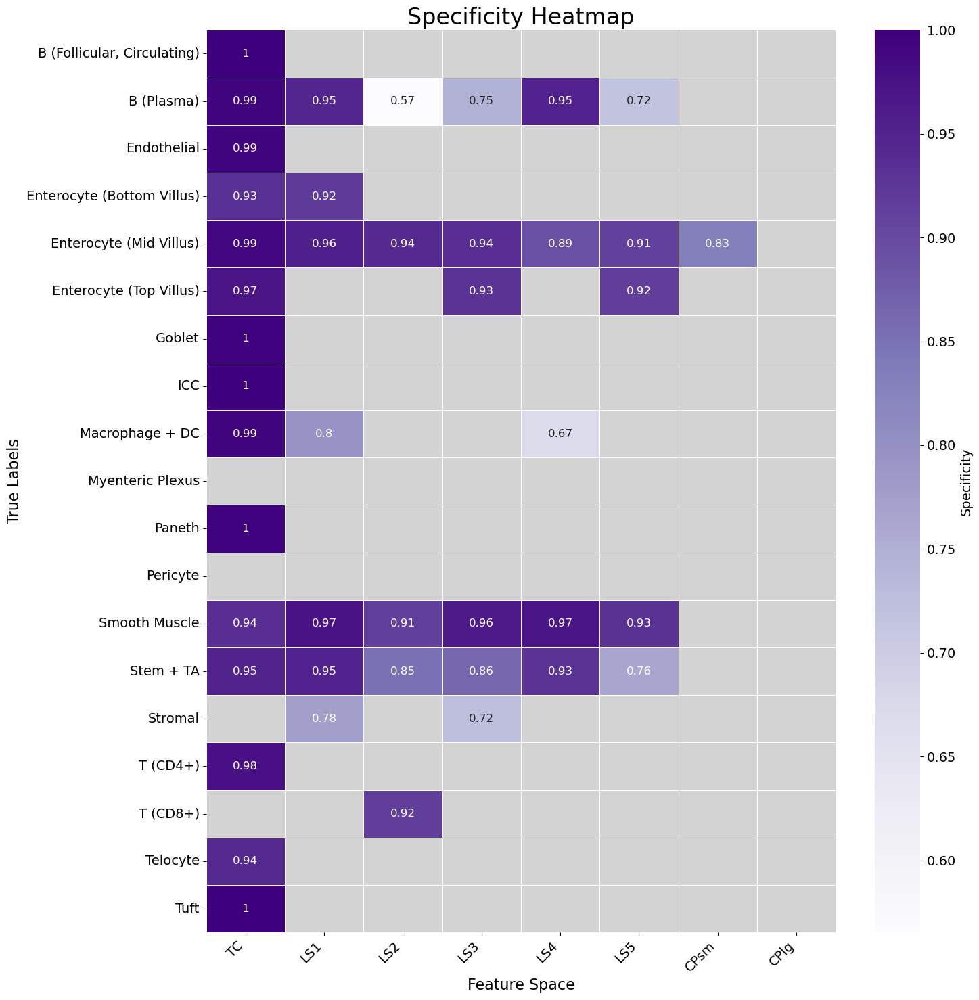

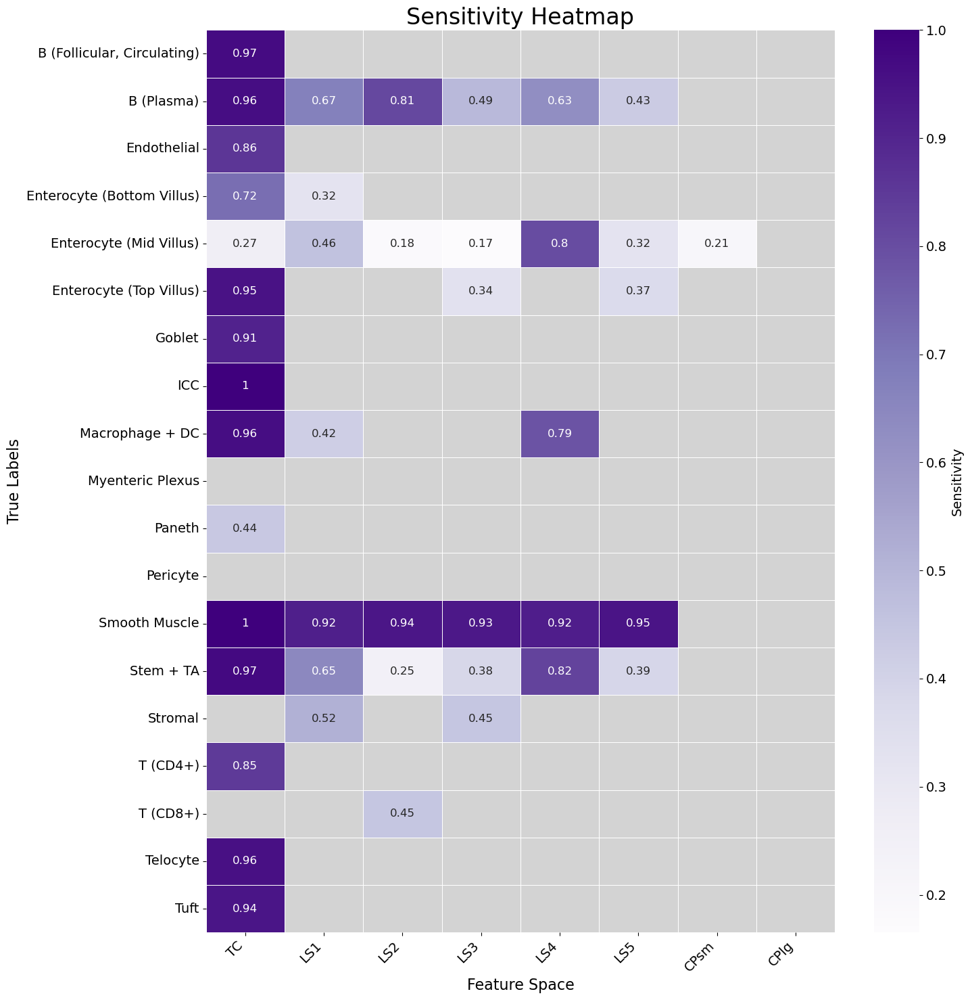

In [12]:
# Making a directory for individual modality analyses
os.makedirs(outputDir + '/individual_modality_metrics', exist_ok=True)
indivOutputDir = outputDir + '/individual_modality_metrics'

datasetCustomOrderList = ['TC', 'LS1', 'LS2', 'LS3', 'LS4', 'LS5', 'CPsm', 'CPlg']

# Clustering metrics for individual datasets, using helper utils fxn
evaluate_clustering(data_object_dictionary=mdObjAll.mod, ground_truth_dataframe=preprocessedDFDict['cell_assignment'], output_directory=indivOutputDir, sort_labels=False, dataset_custom_order_list=datasetCustomOrderList, generate_interaction_plots=False, generate_specificity_heatmap=True, generate_sensitivity_heatmap=True, color_map='Purples', font_size=14)

# Clustering combined modalities

## Finding optimal clustering hyperparameters

In [13]:
# Checking if optimization was already done and the hyperparameter csv exists
optimizationDone = False
os.makedirs(outputDir + '/optimization', exist_ok=True)
mdOptimizedHyperparamsPath = outputDir + '/optimization/MuData_optimal_leiden_hyperparams.csv'
if os.path.isfile(mdOptimizedHyperparamsPath):
    optimizationDone = True

# Generating dictionary of optimized resolutions based on individual modalities (optimized above)
# Note: not explicitly extracting k as the MuData objects contain AnnData objects that have been clustered, thus already have stored k-NN graphs in .obsp['connectivities']. 
# WARNING: It is therefore crucial that no operations that would alter/invalidate the k-NN graphs are run on the AnnData objects between the uniplex and multiplex clustering (instead, deep copy if necessary)
optimalResolutions = {key: value['resolution'] for key, value in optimalLeidenHyperparamsDict['AnnData']['results'].items()}

# Setting ranges for grid search
optimalLeidenHyperparamsDict['MuData']['metadata'] = {
    'MuData_min_clusters': 5,
    'MuData_modality_weight_increment': 0.01
}

if not optimizationDone:
    # Optimizing modality weights
    for key, obj in mdObjComboDict.items():
        # Skipping if TC alone, i.e. AnnData object in the dictionary that may be a remnant of a previous code run
        if key == 'TC':
            continue
            
        # Run multiplex Leiden clustering on the MuData object using fixed modality-specific resolutions
        # (optimized previously for each AnnData modality), and grid search over modality weight combinations.
        # Silhouette score (averaged across modalities) is used to select the optimal weights.
        mdObjOptimalLeidenHyperparams = optimize_leiden_hyperparams(obj, min_clusters=optimalLeidenHyperparamsDict['MuData']['metadata']['MuData_min_clusters'], optimal_MuDataObj_resolution_dict=optimalResolutions, modality_weight_increment=optimalLeidenHyperparamsDict['MuData']['metadata']['MuData_modality_weight_increment'])
        
        # Appending the optimal hyperparams to the optimization dict
        if mdObjOptimalLeidenHyperparams is not None:
            optimalLeidenHyperparamsDict['MuData']['results'][key] = mdObjOptimalLeidenHyperparams.copy()
        else: 
            optimalLeidenHyperparamsDict['MuData']['results'][key] = None
            warnings.warn(f'Could not find optimal weight combination for {key} with given parameters.', category=UserWarning)
            
    # Exporting optimal hyperparameters
    pd.DataFrame.from_dict(optimalLeidenHyperparamsDict['MuData'], orient='index').to_csv(mdOptimizedHyperparamsPath)

else:
    optimalLeidenHyperparamsDict['MuData'] = pd.read_csv(mdOptimizedHyperparamsPath, index_col=0).to_dict(orient='index')
    # Clean up, filtering NaNs from nested dictionary 
    optimalLeidenHyperparamsDict['MuData']['metadata'] = {k: v for k, v in optimalLeidenHyperparamsDict['MuData']['metadata'].items() if not (isinstance(v, float) and pd.isna(v))}
    optimalLeidenHyperparamsDict['MuData']['results'] = {k: v for k, v in optimalLeidenHyperparamsDict['MuData']['results'].items() if not (isinstance(v, float) and pd.isna(v))}

## Clustering combined modalities using optimal Leiden hyperparameters

In [14]:
# Clustering combined modalities
for key, obj in mdObjComboDict.items():
    # Skipping if TC alone, i.e. AnnData object in the dictionary that may be a remnant of a previous code run
    if key == 'TC':
        continue
    # Convert to dictionary if weights is a string due to import from a previous run
    if isinstance(optimalLeidenHyperparamsDict['MuData']['results'][key] , str):
        optimalLeidenHyperparamsDict['MuData']['results'][key]  = ast.literal_eval(optimalLeidenHyperparamsDict['MuData']['results'][key]) 
    
    weights = optimalLeidenHyperparamsDict['MuData']['results'][key]['weights']     
    mu.tl.leiden(obj, resolution=optimalResolutions, key_added='clusters', mod_weights=weights, random_state=137)


## Evaluating combined modality clustering

Exported cluster correlation DataFrame to /home/qptero/Desktop/output2/combined_modality_metrics/cluster_correl_combined.csv


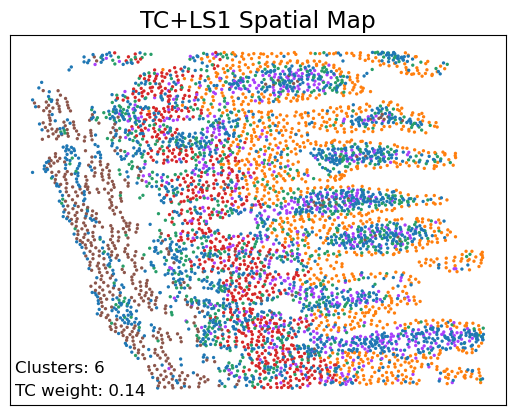

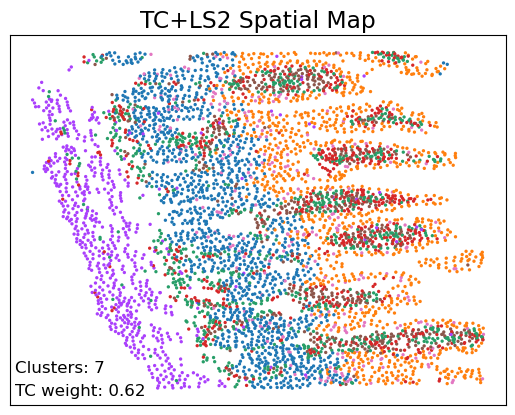

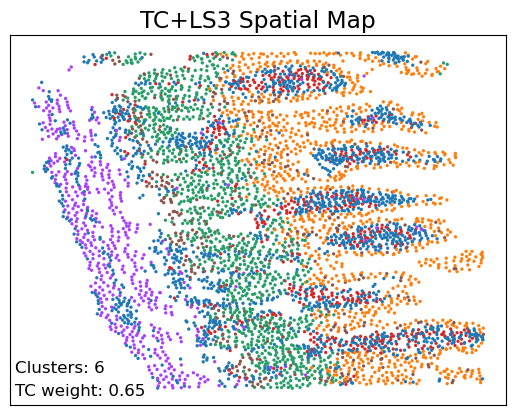

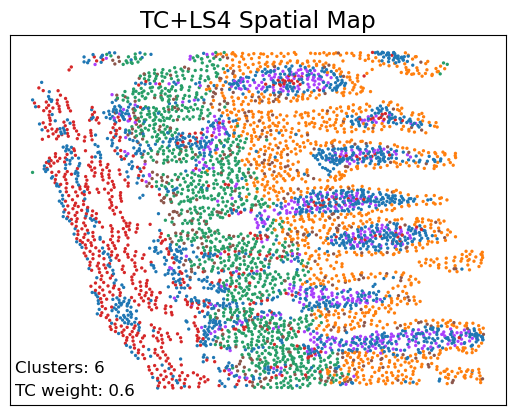

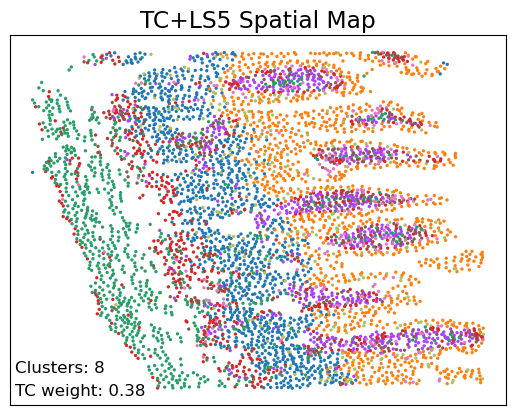

...

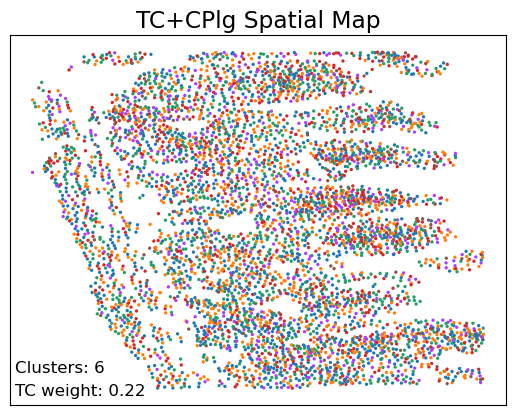

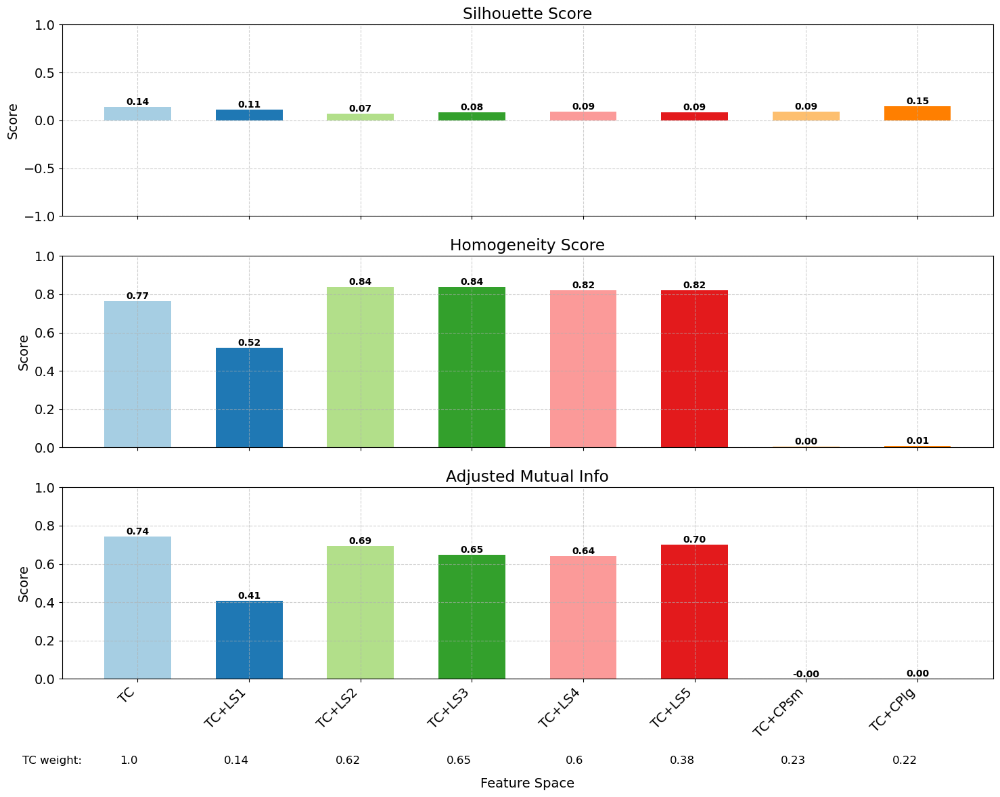

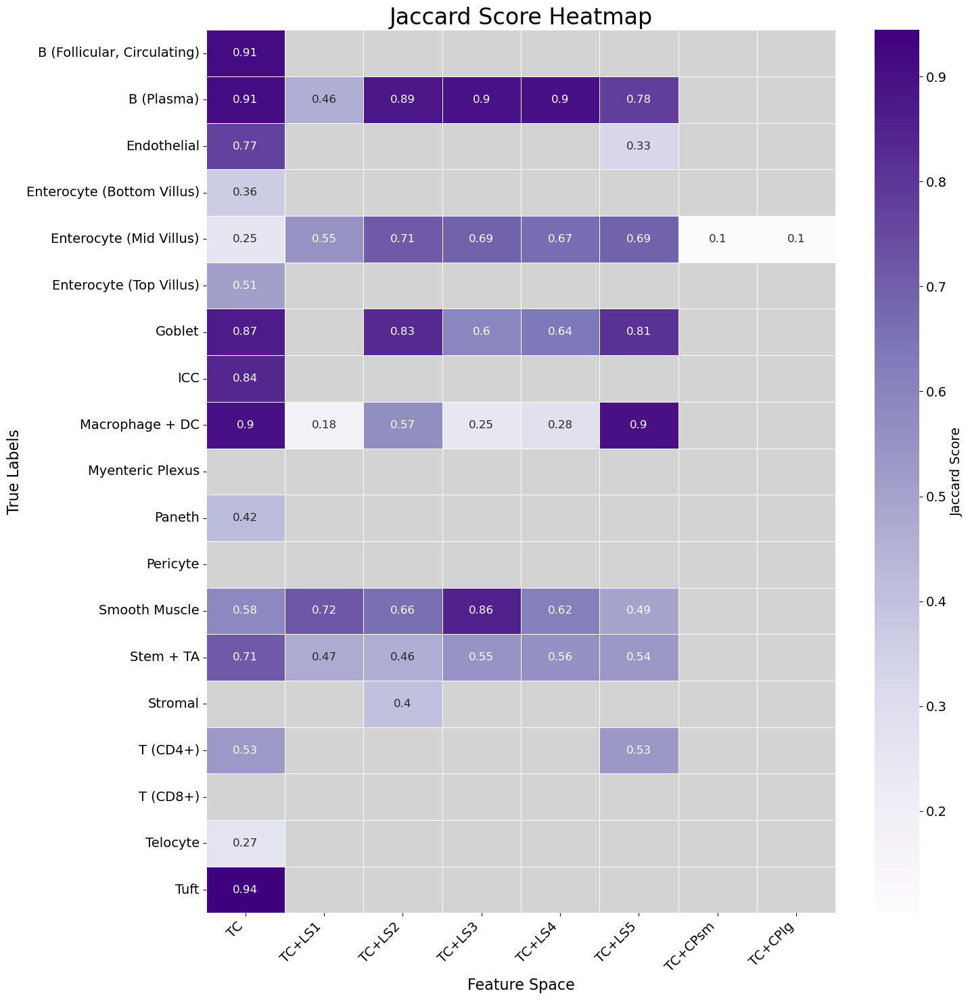

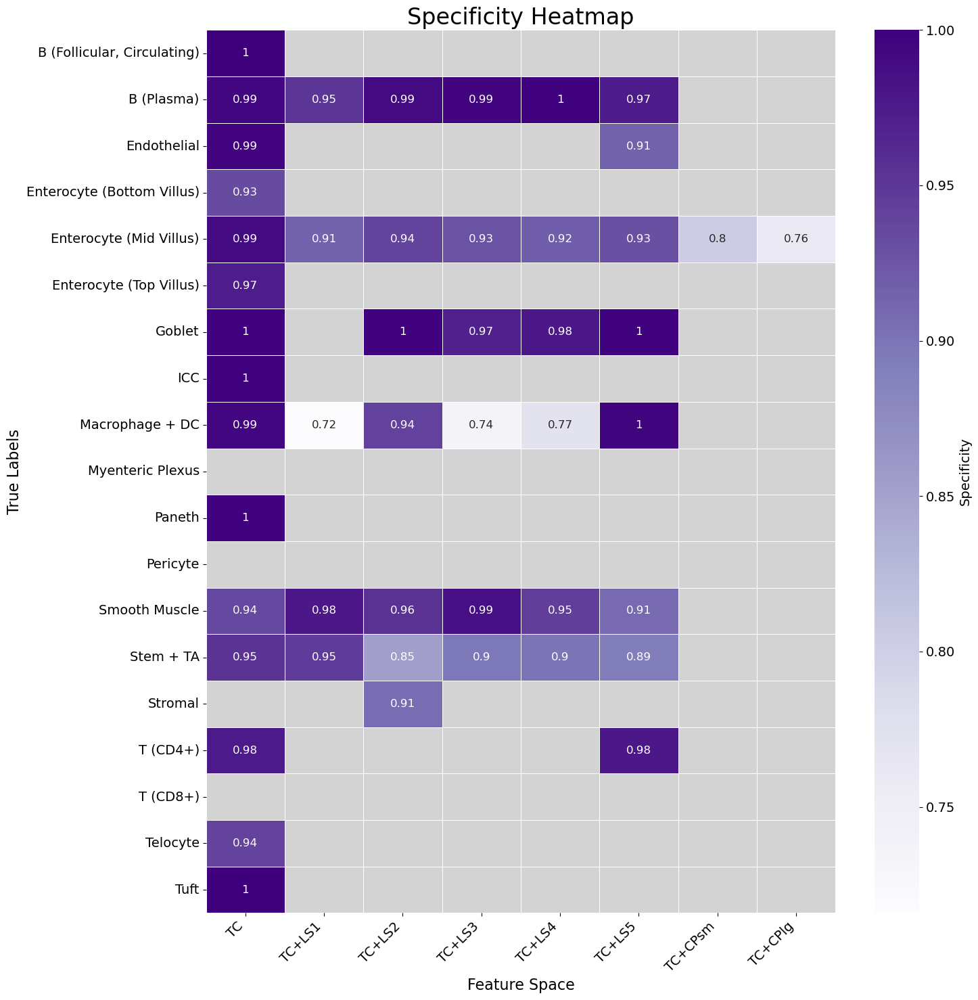

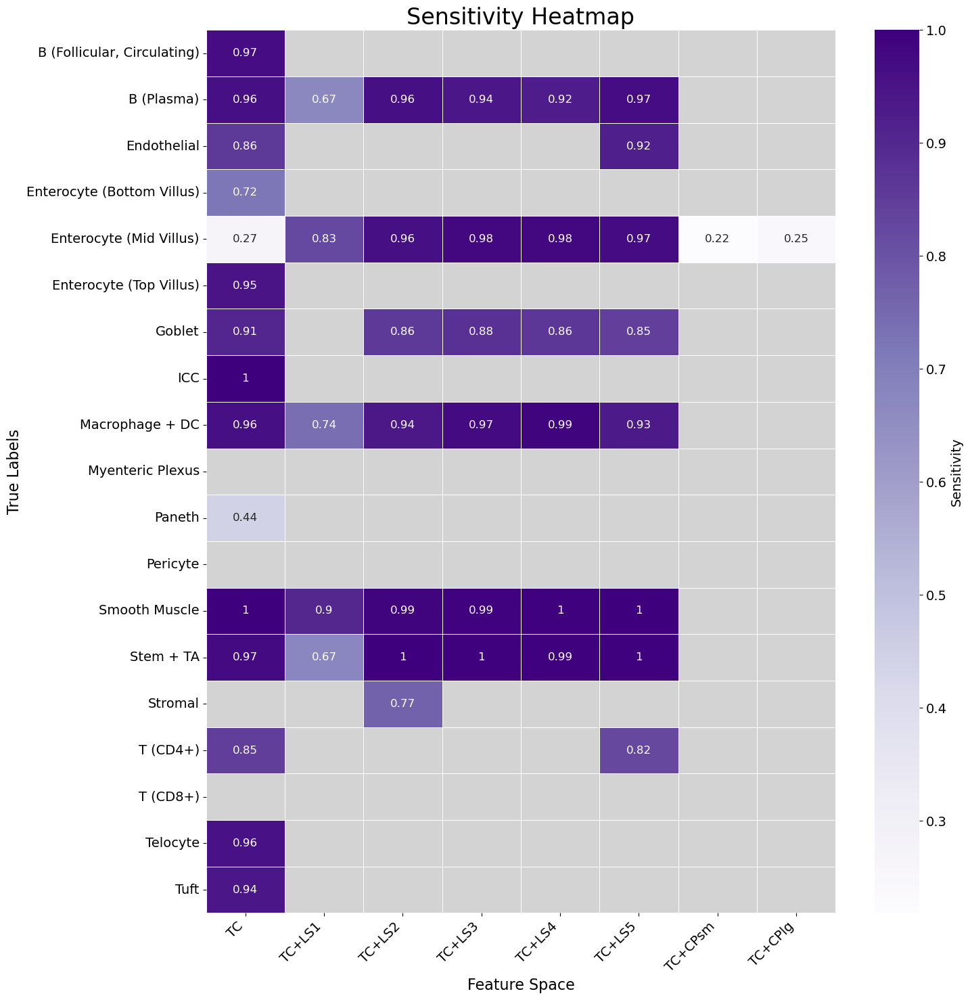

In [15]:
# Adding TC alone for comparison, inserting as first key
mdObjComboDict = {'TC': mdObjAll.mod['TC'], **mdObjComboDict}

# Clustering combined modalities
for key, obj in mdObjComboDict.items():
    if isinstance(obj, sc.AnnData):
        continue # Skipping TC spatial map, redundant visual

    elif isinstance(obj, mu.MuData):
        name = list(obj.mod.keys())[0]
        mu.pl.embedding(obj, basis=f'{name}:spatial', color=['clusters'], title=f'{key} Spatial Map', legend_loc='none', show=False)
        
        # Adding nClusters as text on the plot
        nClusters = obj.obs['clusters'].nunique()
        plt.gca().text(0.01, 0.08, f'Clusters: {nClusters}',
                       horizontalalignment='left',
                       verticalalignment='bottom',
                       transform=plt.gca().transAxes,
                       fontsize=12, color='black')
        # Dropping axis titles
        plt.gca().set_xlabel("")
        plt.gca().set_ylabel("")
        
        # Adding TC weight as text on the plot
        tcWeight = next(iter(optimalLeidenHyperparamsDict['MuData']['results'][key]['weights'].values()))
        plt.gca().text(0.01, 0.02, f'TC weight: {tcWeight}',
                       horizontalalignment='left',
                       verticalalignment='bottom',
                       transform=plt.gca().transAxes,
                       fontsize=12, color='black')
        
        indivModSpatialMapPath = outputDir + f'/spatial_and_umaps/{key}_spatial_map.png'
        plt.savefig(indivModSpatialMapPath, dpi=600, bbox_inches="tight")

# Making a directory for combined modality analyses
os.makedirs(outputDir + '/combined_modality_metrics', exist_ok=True)
comboOutputDir = outputDir + '/combined_modality_metrics'

datasetCustomOrderList = ['TC', 'TC+LS1', 'TC+LS2', 'TC+LS3', 'TC+LS4', 'TC+LS5', 'TC+CPsm', 'TC+CPlg']

# Evaluate clustering using the helper utils fxn
evaluate_clustering(
    data_object_dictionary=mdObjComboDict,
    ground_truth_dataframe=preprocessedDFDict['cell_assignment'],
    output_directory=comboOutputDir,
    dataset_custom_order_list=datasetCustomOrderList,
    sort_labels=False,
    generate_interaction_plots=False,
    generate_specificity_heatmap=True,
    generate_sensitivity_heatmap=True,
    color_map='Purples',
    vertical_dashed_line_positions=None,
    dataset_name_substitution_dict=None,
    leiden_optimization_results=optimalLeidenHyperparamsDict,
    font_size=14
)

## Test to see mid-villus enterocytes are driving the improvement in homogeneity score (as the metric is sensitive to class imbalance)

In [16]:
# Force string indices on the ground truth
preprocessedDFDict["cell_assignment"].index = preprocessedDFDict["cell_assignment"].index.astype(str)

# Isolating the mid-villus enterocytes
cells2Remove = (
    preprocessedDFDict["cell_assignment"]
    .query("cell_type == 'Enterocyte (Mid Villus)'")
    .index
)

print(f"Found {len(cells2Remove)} mid‐villus enterocytes to remove.")

for mdKey, mdObject in mdObjComboDict.items():
    # Computing initial homogeneity, before removing the cells
    score1 = homogeneity_score(mdObject.obs['clusters'], preprocessedDFDict["cell_assignment"]['cell_type'])

    # Force string indices on AnnData, if statement because TC is AnnData and the rest are mudata
    if mdKey == 'TC':
        mdObject.obs_names = mdObject.obs_names.astype(str)
    else:
        mdObject.mod['TC'].obs_names = mdObject.obs_names.astype(str)

    # Confirm overlap
    overlap = set(mdObject.obs_names).intersection(cells2Remove)
    if not overlap:
        print(f"{mdKey}: No overlap. Skipping.")
        continue

    # Remove cells
    filteredObject = mdObject[~mdObject.obs_names.isin(overlap)].copy()

    # Compute homogeneity
    validObservations = filteredObject.obs_names.intersection(preprocessedDFDict["cell_assignment"].index)
    
    yTrue = preprocessedDFDict["cell_assignment"].loc[validObservations, "cell_type"]
    yPred = filteredObject[validObservations].obs["clusters"]
    
    score2 = homogeneity_score(yTrue, yPred)

    print(f"{mdKey}: Removed {len(overlap)} cells. "
          f"Shape was {mdObject.shape}, now {filteredObject.shape}. "
          f"Homogeneity = {score1:.4f} --> {score2:.4f}")


Found 769 mid‐villus enterocytes to remove.
TC: Removed 769 cells. Shape was (5192, 241), now (4423, 241). Homogeneity = 0.7657 --> 0.7546
TC+LS1: Removed 769 cells. Shape was (5192, 291), now (4423, 291). Homogeneity = 0.5222 --> 0.3151
TC+LS2: Removed 769 cells. Shape was (5192, 291), now (4423, 291). Homogeneity = 0.8381 --> 0.5800
TC+LS3: Removed 769 cells. Shape was (5192, 291), now (4423, 291). Homogeneity = 0.8392 --> 0.5054
TC+LS4: Removed 769 cells. Shape was (5192, 291), now (4423, 291). Homogeneity = 0.8214 --> 0.5052
TC+LS5: Removed 769 cells. Shape was (5192, 261), now (4423, 261). Homogeneity = 0.8207 --> 0.6040
TC+CPsm: Removed 769 cells. Shape was (5192, 378), now (4423, 378). Homogeneity = 0.0044 --> 0.0031
TC+CPlg: Removed 769 cells. Shape was (5192, 380), now (4423, 380). Homogeneity = 0.0071 --> 0.0053


# Classifier cross validation (random forest)

In [17]:
# Initialize results storage
overallResults = []
perLabelResults = {}

# Define 5-fold stratified CV
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=137)

# Iterate over each feature space (modality)
for key, obj in mdObjAll.mod.items():
    print(f"Processing feature space: {key}")

    # Extract feature matrix and standardize
    X = np.nan_to_num(obj.X, nan=np.nanmean(obj.X, axis=0))  
    XStandardized = StandardScaler().fit_transform(X)  

    # Extract true labels
    y = preprocessedDFDict['cell_assignment']['cell_type'].values 

    # Initialize classifier
    model = RandomForestClassifier(
        n_estimators=1000,
        class_weight="balanced",
        random_state=137,
        n_jobs=-1
    )

    # Store per-label AUC & Balanced Accuracy
    perLabelAUC = {label: [] for label in np.unique(y)}
    perLabelBalAccuracy = {label: [] for label in np.unique(y)}

    # Store overall scores across folds (initialization)
    aucScores = []
    balAccuracyScores = []

    # Cross-validation loop
    for train_idx, test_idx in cv.split(XStandardized, y):
        model.fit(XStandardized[train_idx], y[train_idx])
        yProb = model.predict_proba(XStandardized[test_idx])
        yPred = model.predict(XStandardized[test_idx])

        # Compute overall metrics (macro-level)
        aucScores.append(roc_auc_score(y[test_idx], yProb, multi_class='ovr'))
        balAccuracyScores.append(balanced_accuracy_score(y[test_idx], yPred))

        # Compute per-label metrics
        for i, label in enumerate(np.unique(y)):
            labelMask = (y[test_idx] == label)
            if np.sum(labelMask) > 1:  # AUC here is binary AUC treating current label vs rest (not full multiclass AUC)
                perLabelAUC[label].append(roc_auc_score(labelMask, yProb[:, i]))
                perLabelBalAccuracy[label].append(balanced_accuracy_score(labelMask, (yPred == label)))

    # Store overall results (averaged across folds)
    overallResults.append({
        "Feature Space": key,
        "Mean AUC": np.mean(aucScores),
        "AUC Std Dev": np.std(aucScores),
        "Mean Balanced Accuracy": np.mean(balAccuracyScores),
        "Balanced Accuracy Std Dev": np.std(balAccuracyScores)
    })

    # Store per-label results (averaging over folds)
    perLabelResults[key] = {
        "AUC": {lbl: np.mean(perLabelAUC[lbl]) if len(perLabelAUC[lbl]) > 0 else np.nan for lbl in perLabelAUC},
        "Balanced Accuracy": {lbl: np.mean(perLabelBalAccuracy[lbl]) if len(perLabelBalAccuracy[lbl]) > 0 else np.nan for lbl in perLabelBalAccuracy}
    }

# Convert results to DFs 
overallResultsDF = pd.DataFrame(overallResults)
perLabelAucDF = pd.DataFrame({key: perLabelResults[key]["AUC"] for key in perLabelResults})
perLabelBalAccuracyDF = pd.DataFrame({key: perLabelResults[key]["Balanced Accuracy"] for key in perLabelResults})

Processing feature space: TC
Processing feature space: LS1
Processing feature space: LS2
Processing feature space: LS3
Processing feature space: LS4
Processing feature space: LS5
Processing feature space: CPsm
Processing feature space: CPlg


## Plotting AUC and balanced accuracy

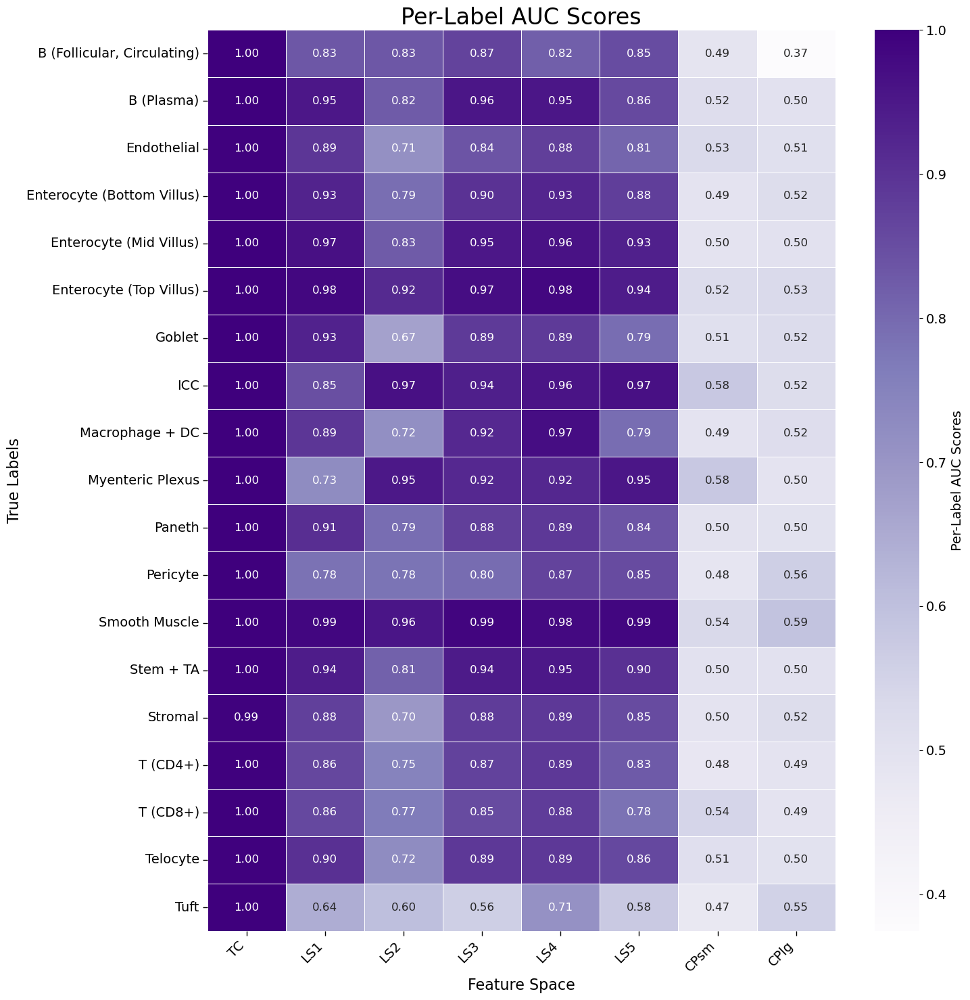

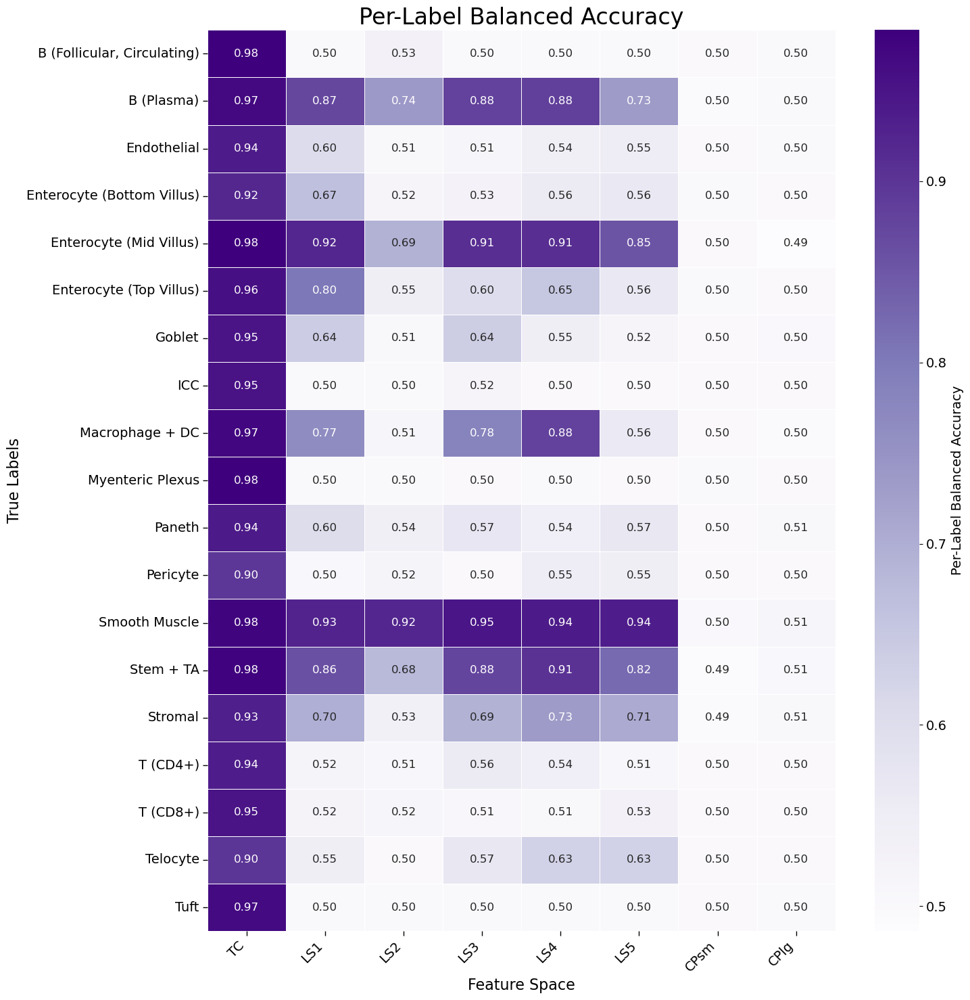

In [18]:
def plot_per_label_performance(df, title, cmap="Purples", font_size=14):
    plt.rcParams.update({'font.size': font_size})
    plt.figure(figsize=(15, 15), facecolor='white')
    ax = sns.heatmap(
        df,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        linewidths=0.5,
        linecolor='white',
        cbar=True,
        cbar_kws={'label': title},
        annot_kws={'size': font_size - 2}
    )
    ax.set_facecolor('lightgrey')

    # Ticks
    ax.tick_params(
        axis='both',
        which='both',
        bottom=True,
        top=False,
        left=True,
        right=False,
        length=5,        
        width=1,
        color='black'
    )

    # Center tick labels in cells
    ax.set_xticks(np.arange(df.shape[1]) + 0.5)
    ax.set_yticks(np.arange(df.shape[0]) + 0.5)
    ax.set_xticklabels(df.columns, rotation=45, ha='right')
    ax.set_yticklabels(df.index, rotation=0)

    plt.title(title, fontsize=font_size + 10)
    plt.xlabel("Feature Space", fontsize=font_size + 2)
    plt.ylabel("True Labels", fontsize=font_size + 2)
    plt.tight_layout()
    
    # Saving
    path_AUC_figure = outputDir + '/stats/AUC_heatmap.png'
    path_balanced_accuracy_figure = outputDir + '/stats/balanced_accuracy_heatmap.png'
    plt.savefig(path_AUC_figure, bbox_inches='tight', dpi=600)
    plt.savefig(path_balanced_accuracy_figure, bbox_inches='tight', dpi=600)
    
    plt.show()

# Plotting
plot_per_label_performance(perLabelAucDF, "Per-Label AUC Scores")
plot_per_label_performance(perLabelBalAccuracyDF, "Per-Label Balanced Accuracy")

# Ridge regression (TC predictability from LS2)

Top Predictable Genes:
    Gene_Name  R2_Score    Raw_P_Value  Adjusted_P_Value
159     Neat1  0.274065   6.150218e-75      2.964405e-73
38      Chrm2  0.258913  8.857130e-159     2.134568e-156
1       Acta2  0.245216  3.781402e-158     4.556589e-156
202    Slc5a1  0.232973   1.477315e-72      5.933883e-71
201    Slc51a  0.213334   3.646747e-63      1.255523e-61
15       Apob  0.210919   3.175486e-85      2.550973e-83
161      Net1  0.112705   2.275346e-37      3.046435e-36
164     Nlrp6  0.108467   3.256007e-33      3.566807e-32
79      Galr2  0.106103   7.638624e-76      4.602271e-74
240       Vim  0.097329   6.502056e-22      5.054824e-21


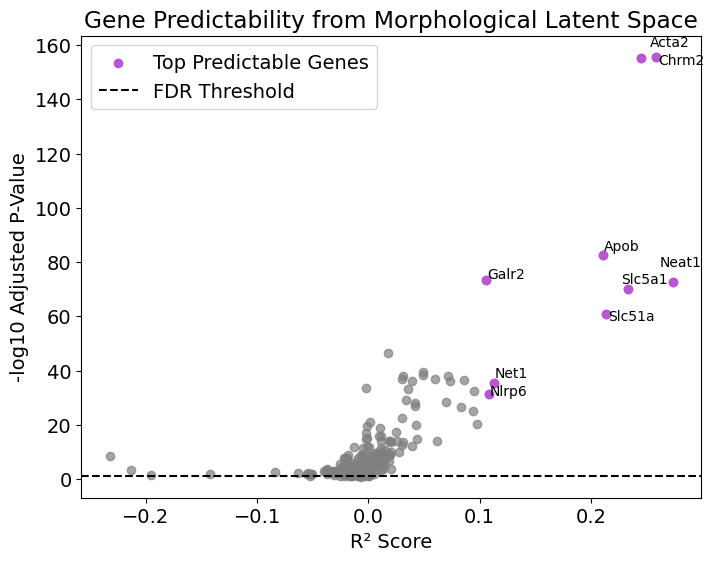

In [19]:
# Extract latent space (X) and gene expression (Y)
X = mdObjAll.mod['LS2'].X 
Y = mdObjAll.mod['TC'].X
geneNames = mdObjAll.mod['TC'].var_names

# Ensure alignment
assert X.shape[0] == Y.shape[0], "Mismatch in number of cells"

# Split into train/test sets
xTrain, xTest, yTrain, yTest = train_test_split(X, Y, test_size=0.2, random_state=137)

# Initialize dicts
r2ScoresDict = {}
rawRegressionPvalDict = {}

# Fit regression model
for geneIdx, geneName in enumerate(geneNames):
    model = Ridge(alpha=1.0) # Ridge regression, regularized to prevent overfitting
    model.fit(xTrain, yTrain[:, geneIdx])
    yPredRegression = model.predict(xTest)

    # Compute R²
    r2ScoresDict[geneName] = r2_score(yTest[:, geneIdx], yPredRegression)

    # Compute raw p-values
    _, regressionPVal = f_regression(xTrain, yTrain[:, geneIdx])
    rawRegressionPvalDict[geneName] = np.min(regressionPVal)  # Take the "most," so to speak, significant latent var in terms of predicting the given gene, essentially a crude proxy for gene predictability

# Adjust p-values using Benjamini-Hochberg (multiple testing correction)
geneList = list(r2ScoresDict.keys())
regressionAdjPVals = multipletests(list(rawRegressionPvalDict.values()), method="fdr_bh")[1]

# Convert to df
regressionResults = pd.DataFrame({
    'Gene_Name': geneList,
    'R2_Score': list(r2ScoresDict.values()),
    'Raw_P_Value': list(rawRegressionPvalDict.values()),
    'Adjusted_P_Value': regressionAdjPVals
})

# Sort by R²
regressionResults.sort_values(by='R2_Score', ascending=False, inplace=True)

print("Top Predictable Genes:")
print(regressionResults.head(10)) 

# Plot
plt.figure(figsize=(8, 6))

# Scatter plot for all genes
plt.scatter(
    regressionResults["R2_Score"], 
    -np.log10(regressionResults["Adjusted_P_Value"]), 
    alpha=0.7, 
    color="gray"
)

# Highlight top pred genes
regressionSigGenes = regressionResults[
    (regressionResults["Adjusted_P_Value"] < 0.05) &
    (regressionResults["R2_Score"] > 0.1)
    ]
plt.scatter(
    regressionSigGenes["R2_Score"], 
    -np.log10(regressionSigGenes["Adjusted_P_Value"]), 
    color="mediumorchid", 
    label="Top Predictable Genes"
)

# Annotate the top 10 genes by R², which are under 10 anyway at the chosen alpha
regressionTopGenes = regressionSigGenes.nlargest(10, "R2_Score")

annotations = []
for _, row in regressionTopGenes.iterrows():
    x, y = row["R2_Score"], -np.log10(row["Adjusted_P_Value"])
    annotation = plt.text(
        x, y, row["Gene_Name"], fontsize=10, ha="left"
    )
    annotations.append(annotation)

# Automatically adjust text positions to prevent overlap
adjust_text(annotations, expand_points=(1.2, 1.2), arrowprops=None)

plt.xlabel("R² Score")
plt.ylabel("-log10 Adjusted P-Value")
plt.title("Gene Predictability from Morphological Latent Space")
plt.axhline(-np.log10(0.05), color="black", linestyle="dashed", label="FDR Threshold")  # FDR threshold line
plt.legend()

regressionPlotPath = outputDir + '/stats/regression_figure.png'
plt.savefig(regressionPlotPath, bbox_inches='tight', dpi=600)

plt.show()

## Plotting average expression patterns of top predictable genes from LS2

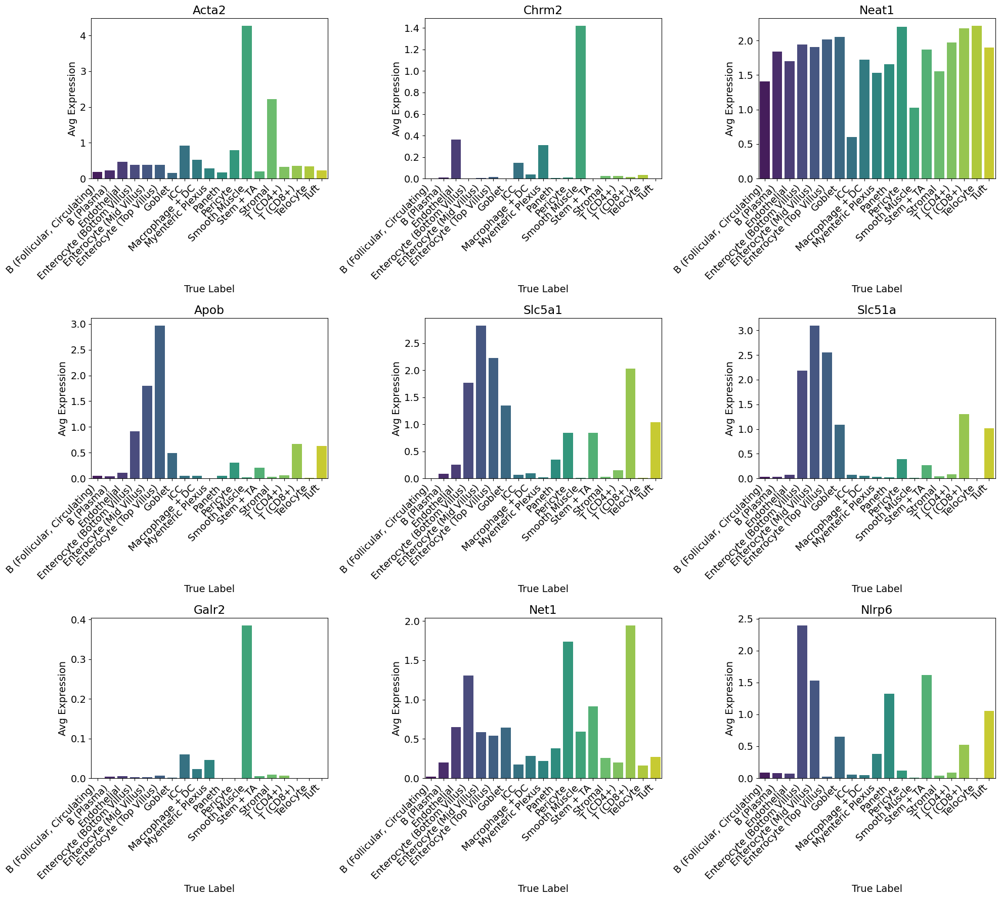

In [20]:
# Top 9 predictable genes
regressionTopGenes = ["Acta2", "Chrm2", "Neat1", "Apob", "Slc5a1", "Slc51a", "Galr2", "Net1", "Nlrp6"]

# TC DF with true labels
tempTCDF = pd.DataFrame(Y, columns=geneNames)
tempTCDF["true_label"] = mdObjAll.mod['TC'].obs['true_label_clusters'].values

# Avg expression per true label
avgExpressionTopRegressionGenesPerLabel = tempTCDF.groupby("true_label")[regressionTopGenes].mean().reset_index()

# Plot a barplot for each gene with the x-axis as true labels and y-axis as average expression
n_genes = len(regressionTopGenes)
ncols = 3
nrows = int(np.ceil(n_genes / ncols))

plt.figure(figsize=(20, 18))
for i, gene in enumerate(regressionTopGenes, 1):
    plt.subplot(nrows, ncols, i)
    sns.barplot(x="true_label", y=gene, data=avgExpressionTopRegressionGenesPerLabel, palette="viridis")
    plt.xlabel("True Label")
    plt.ylabel("Avg Expression")
    plt.title(gene)
    plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()
